In [1]:
from CovMat import *
import gc
from cl_and_cov import *
from signal_to_noise import *
from fisher_FoM import *

In [2]:
import numpy as np
Omega_m=0.315
Omega_b=0.045
h=0.67
sigma8=0.8
n_s=0.96
w_0 = -1
w_a = 0
transfer_function = 'bbks'
fsky = 0.4
ell = np.arange(5, 3001)

In [3]:
# Input Cosmology object with a given set of parameters
cosmo = ccl.Cosmology(
    Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s,
    transfer_function=transfer_function)

In [4]:
arcmin_per_str=(180*60/np.pi)**2
#how many square arcminutes are there in a steradian 
numdenPerStr = arcmin_per_str*10.024

In [5]:
#binning in l
binl=10**np.linspace(np.log10(9), np.log10(2700), 20)

In [6]:
binl

array([   9.        ,   12.15114805,   16.40559988,   22.14965255,
         29.90485638,   40.3753708 ,   54.5119009 ,   73.59801981,
         99.36671498,  134.15774054,  181.13006303,  244.54869022,
        330.17192667,  445.77421806,  601.85205779,  812.57705086,
       1097.0826718 , 1481.20155189, 1999.8110386 , 2700.        ])

In [7]:
#try a symmetric distribution
def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
dndz_s = np.zeros([600,2])
dndz_s[:, 0] = np.linspace(0.001, 4.001, 600)

In [8]:
dndz_s[100, 0]

0.668779632721202

In [9]:
dndz_s[0:200, 1] = gaussian(dndz_s[0:200, 0], (dndz_s[100, 0]+dndz_s[101, 0])/2, 0.5)
dndz_s[200:400, 1] = gaussian(dndz_s[200:400, 0], (dndz_s[301, 0]+dndz_s[300, 0])/2, 0.5)
dndz_s[400:600, 1] = gaussian(dndz_s[400:600, 0], (dndz_s[501, 0]+dndz_s[500, 0])/2, 0.5)

In [10]:
cl_s = {} 
cov_s = {}
redshifts_s = {}
cov_cosmic_var_s = {}
cov_shape_s = {}
sliced_dndz_s = {}

for n in range(1,7):
    for btype in ["z", "n"]:
        cov_s["{0}_{1}".format(btype, n)], cl_s["{0}_{1}".format(btype, n)], redshifts_s["{0}_{1}".format(btype, n)], sliced_dndz_s["{0}_{1}".format(btype, n)] = getDataArray(n_bins=n, bin_type=btype, cosmo=cosmo, dndz=dndz_s, ell=ell, numdenPerStr = numdenPerStr, fsky=0.4, shape_noise=0.23)
        cov_cosmic_var_s["{0}_{1}".format(btype, n)] = getCovMat(fsky, n, cl_s["{0}_{1}".format(btype, n)],  sliced_dndz_s["{0}_{1}".format(btype, n)], numdenPerStr, ell)
        cov_shape_s["{0}_{1}".format(btype, n)] = cov_s["{0}_{1}".format(btype, n)] - cov_cosmic_var_s["{0}_{1}".format(btype, n)]

In [11]:
for i in ["z", "n"]:
    for j in range(1,7):
        print(num_den(sliced_dndz_s["{0}_{1}".format(i,j)], numdenPerStr))

[1.18464663e+08]
[59080608.04864304 59384055.02042077]
[39488221.02302127 39488221.02302127 39488221.02302127]
[31604328.37935706 27476279.66928597 27579049.6023658  31805005.41805496]
[24682981.67283034 20545170.81933648 27846129.38036034 20421973.50410908
 24968407.69242757]
[19592387.02562177 19895833.9973995  19592387.02562177 19895833.9973995
 19592387.02562177 19895833.9973995 ]
[1.18464663e+08]
[59080608.04864304 59384055.02042077]
[39488221.02302127 39488221.02302127 39488221.02302127]
[29441871.26550408 29638736.78313896 29707119.18306949 29676935.83735127]
[23680759.67573693 23695493.46185772 23507830.81544695 23858936.41763055
 23721642.69839163]
[19592387.02562177 19895833.9973995  19592387.02562177 19895833.9973995
 19592387.02562177 19895833.9973995 ]


In [12]:
for i in ["z", "n"]:
    for j in range(1,7):
        print(np.sum(num_den(sliced_dndz_s["{0}_{1}".format(i,j)], numdenPerStr)))

118464663.0690638
118464663.06906381
118464663.0690638
118464663.0690638
118464663.06906381
118464663.0690638
118464663.0690638
118464663.06906381
118464663.0690638
118464663.0690638
118464663.06906378
118464663.0690638


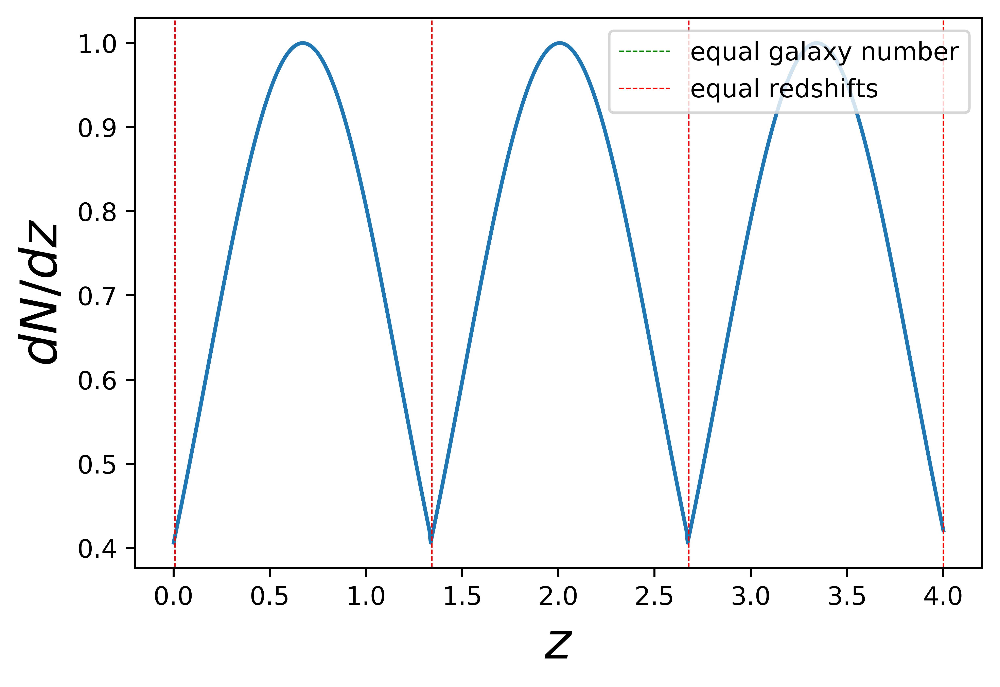

In [13]:
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_3"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_3"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

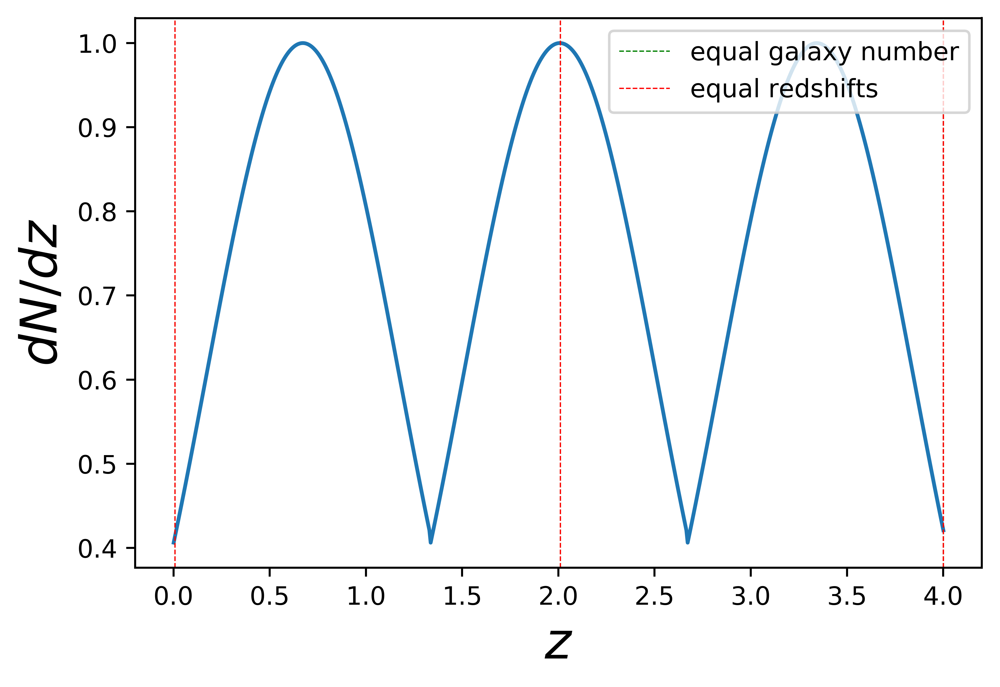

In [14]:
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_2"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_2"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

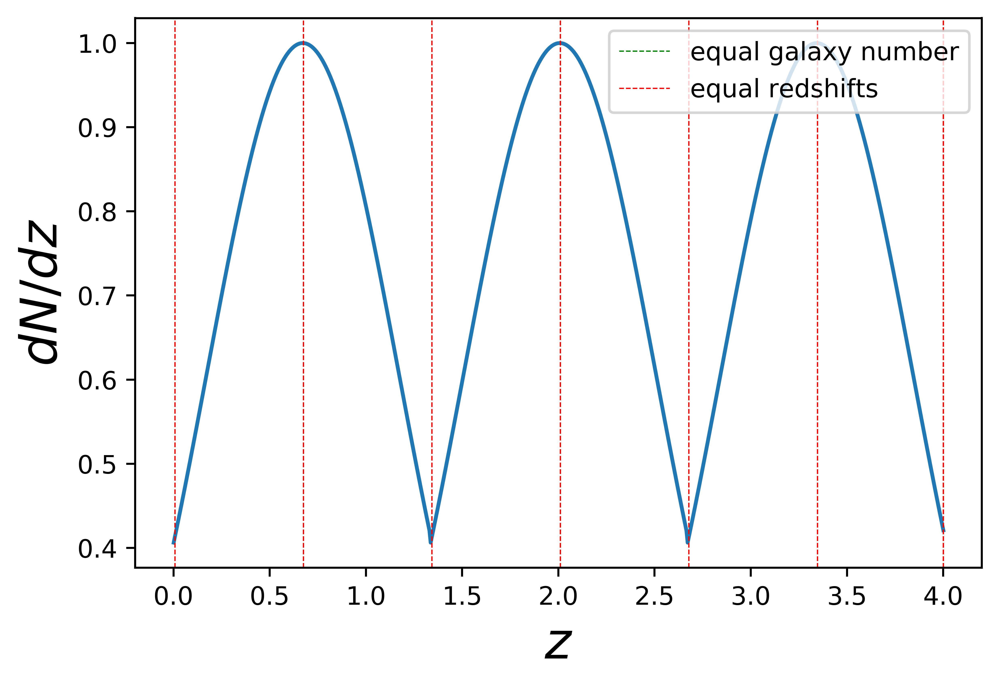

In [15]:
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_6"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_6"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

In [16]:
stn_s = {}
for i in ["z", "n"]:
    for j in range(1,7):
        stn_s["{0}_{1}".format(i,j)] = SignalToNoise(bins_in_z=j, binl=binl, cl = cl_s["{0}_{1}".format(i, j)], cov = cov_s["{0}_{1}".format(i, j)], ell=ell)

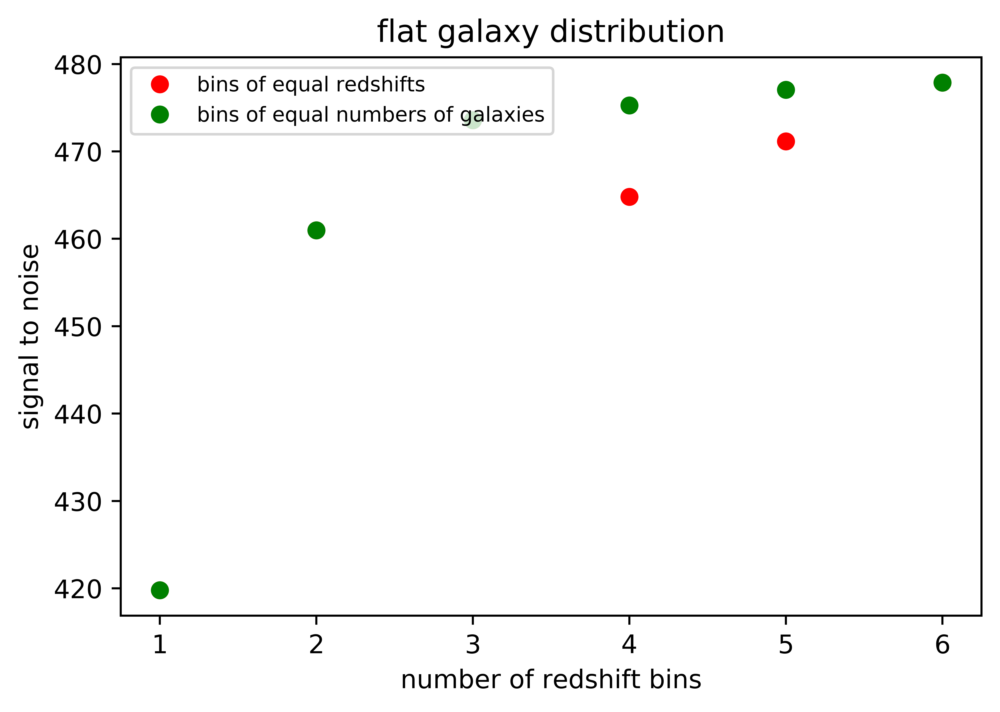

In [17]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4, 5, 6], [stn_s["z_1"], stn_s["z_2"], stn_s["z_3"], stn_s["z_4"], stn_s["z_5"], stn_s["z_6"]],
         color='r', linestyle='None', marker ="o", markersize = 6.0, label = "bins of equal redshifts")
plt.plot([1, 2, 3, 4, 5, 6], [stn_s["n_1"], stn_s["n_2"], stn_s["n_3"], stn_s["n_4"], stn_s["n_5"], stn_s["n_6"]],
         color='g', linestyle='None', marker ="o", markersize = 6.0, label = "bins of equal numbers of galaxies")
plt.xlabel("number of redshift bins")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=8)
plt.title('flat galaxy distribution')
plt.show() 

the tomographic bin division looks reasonable

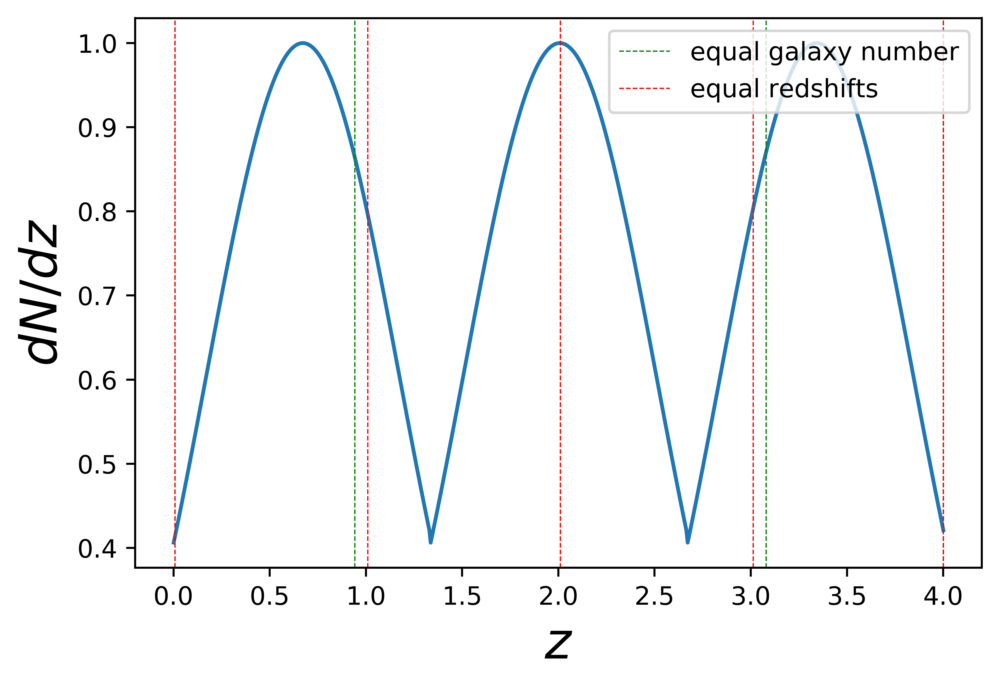

In [18]:
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_4"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_4"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()


for 4 redshift bins, we would expect bin 1 of equal redshift having higher signal than bin 1 of equal galaxy number. We would also expect bin 4 of equal galaxy number having higher signal than bin 4 of equal redshift. let's check that.

In [19]:
binned_cl_s = {}
binned_cov_s = {}
binned_cov_cosvar_s = {}
binned_cov_shape_s = {}
binned_cl_s["z_4"] = binnedCl(4, binl, cl_s["z_4"], ell)
binned_cl_s["n_4"] = binnedCl(4, binl, cl_s["n_4"], ell)
binned_cov_s["z_4"] = binnedCov(4, binl, cov_s["z_4"], ell)
binned_cov_s["n_4"] = binnedCov(4, binl, cov_s["n_4"], ell)
binned_cov_cosvar_s["z_4"] = binnedCov(4, binl, cov_cosmic_var_s["z_4"], ell)
binned_cov_shape_s["z_4"] = binnedCov(4, binl, cov_shape_s["z_4"], ell)
binned_cov_cosvar_s["n_4"] = binnedCov(4, binl, cov_cosmic_var_s["n_4"], ell)
binned_cov_shape_s["n_4"] = binnedCov(4, binl, cov_shape_s["n_4"], ell)

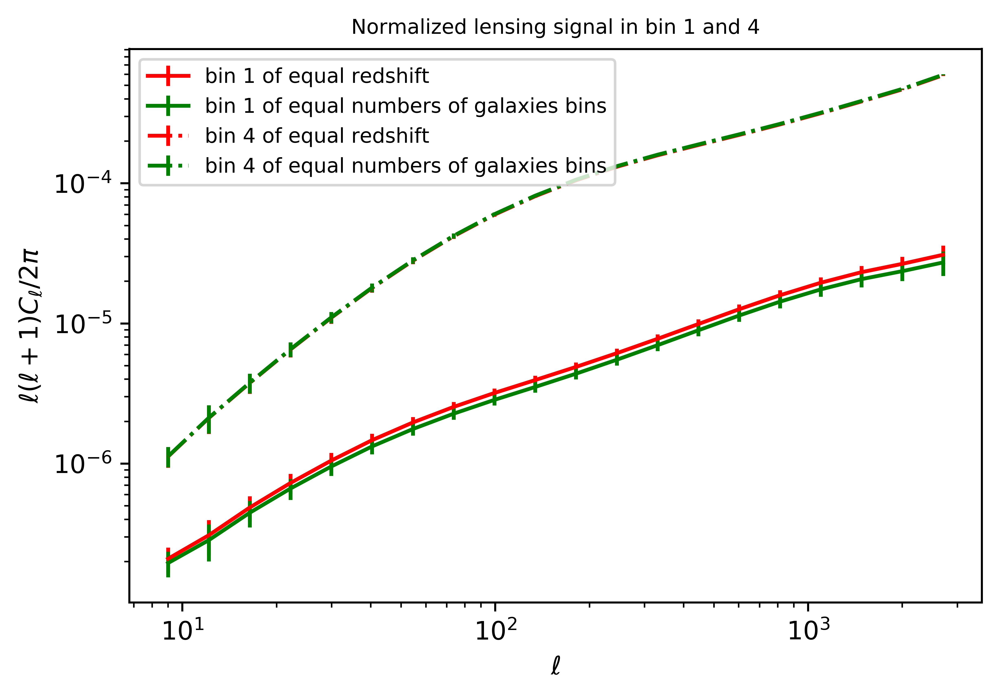

In [63]:
plt.figure()

plt.errorbar(binl, normalizing(binned_cl_s["z_4"][0], binl), yerr = normalizing(np.sqrt(binned_cov_s["z_4"][:, 0, 0]), binl), color='r', label = "bin 1 of equal redshift")
plt.errorbar(binl, normalizing(binned_cl_s["n_4"][0], binl), yerr = normalizing(np.sqrt(binned_cov_s["n_4"][:, 0, 0]), binl), color='g', label = "bin 1 of equal numbers of galaxies bins")

plt.errorbar(binl, normalizing(binned_cl_s["z_4"][9], binl), yerr = normalizing(np.sqrt(binned_cov_s["z_4"][:, 9, 9]), binl), color='r', ls='-.', label = "bin 4 of equal redshift")
plt.errorbar(binl, normalizing(binned_cl_s["n_4"][9], binl), yerr = normalizing(np.sqrt(binned_cov_s["n_4"][:, 9, 9]), binl), color='g', ls='-.', label = "bin 4 of equal numbers of galaxies bins")


plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell(\ell+1)C_{\ell}/2\pi$')
plt.legend(loc="upper left")
plt.title("Normalized lensing signal in bin 1 and 4", fontsize=8)
plt.show() 

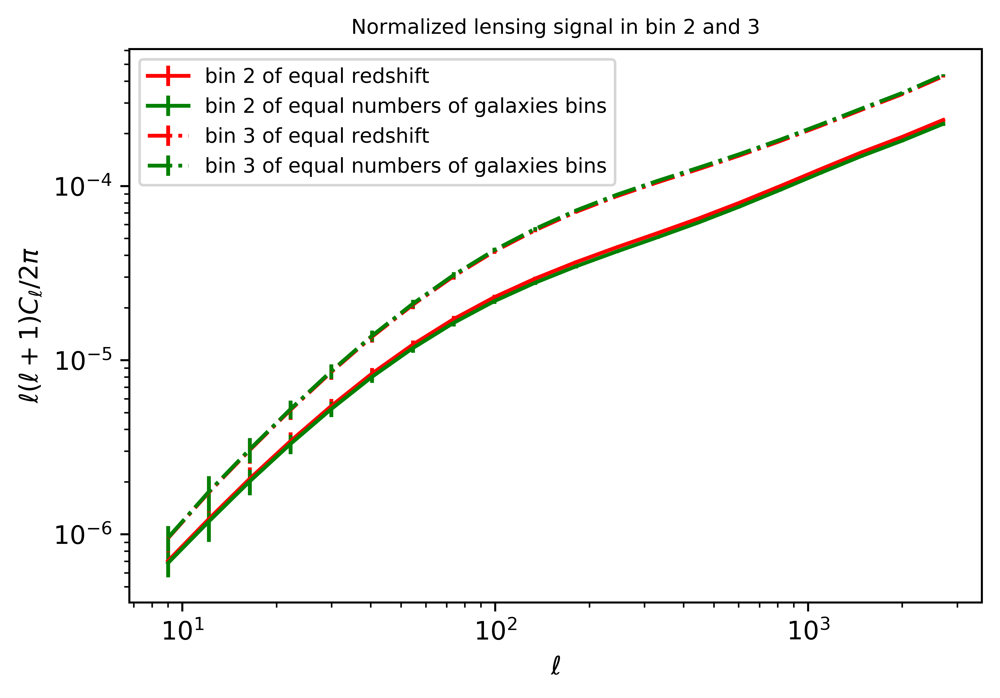

In [65]:
plt.figure()

plt.errorbar(binl, normalizing(binned_cl_s["z_4"][4], binl), yerr = normalizing(np.sqrt(binned_cov_s["z_4"][:, 4, 4]), binl), color='r', label = "bin 2 of equal redshift")
plt.errorbar(binl, normalizing(binned_cl_s["n_4"][4], binl), yerr = normalizing(np.sqrt(binned_cov_s["n_4"][:, 4, 4]), binl), color='g', label = "bin 2 of equal numbers of galaxies bins")

plt.errorbar(binl, normalizing(binned_cl_s["z_4"][7], binl), yerr = normalizing(np.sqrt(binned_cov_s["z_4"][:, 7, 7]), binl), color='r', ls='-.', label = "bin 3 of equal redshift")
plt.errorbar(binl, normalizing(binned_cl_s["n_4"][7], binl), yerr = normalizing(np.sqrt(binned_cov_s["n_4"][:, 7, 7]), binl), color='g', ls='-.', label = "bin 3 of equal numbers of galaxies bins")


plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell(\ell+1)C_{\ell}/2\pi$')
plt.legend(loc="upper left")
plt.title("Normalized lensing signal in bin 2 and 3", fontsize=8)
plt.show() 

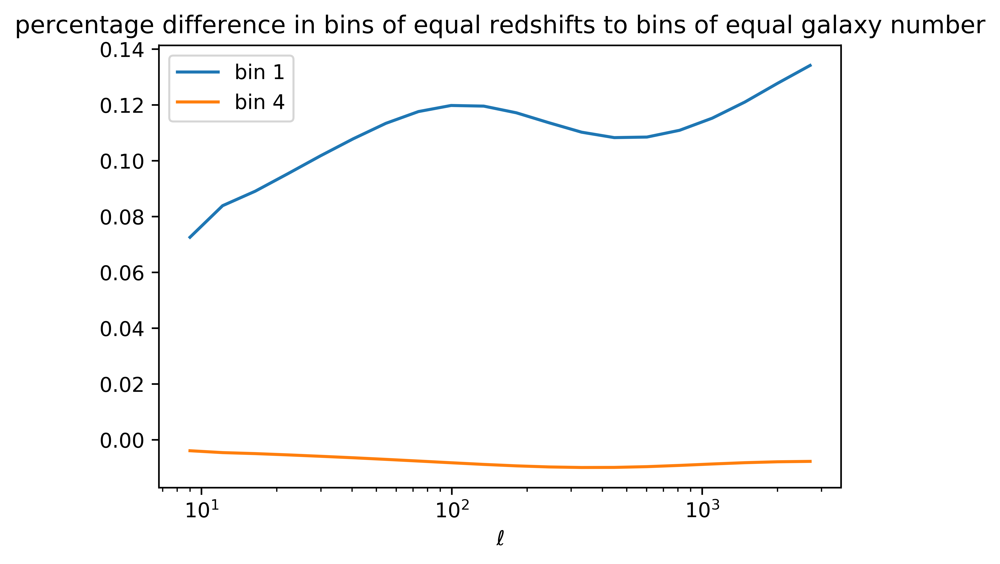

In [21]:
plt.figure()

plt.plot(binl, normalizing(binned_cl_s["z_4"][0], binl)/normalizing(binned_cl_s["n_4"][0], binl)-1, label = "bin 1")
plt.plot(binl, normalizing(binned_cl_s["z_4"][9], binl)/normalizing(binned_cl_s["n_4"][9], binl)-1, label = "bin 4")

plt.xscale('log')
plt.xlabel(r'$\ell$')
plt.legend(loc="upper left")
plt.title("percentage difference in bins of equal redshifts to bins of equal galaxy number")
plt.show() 

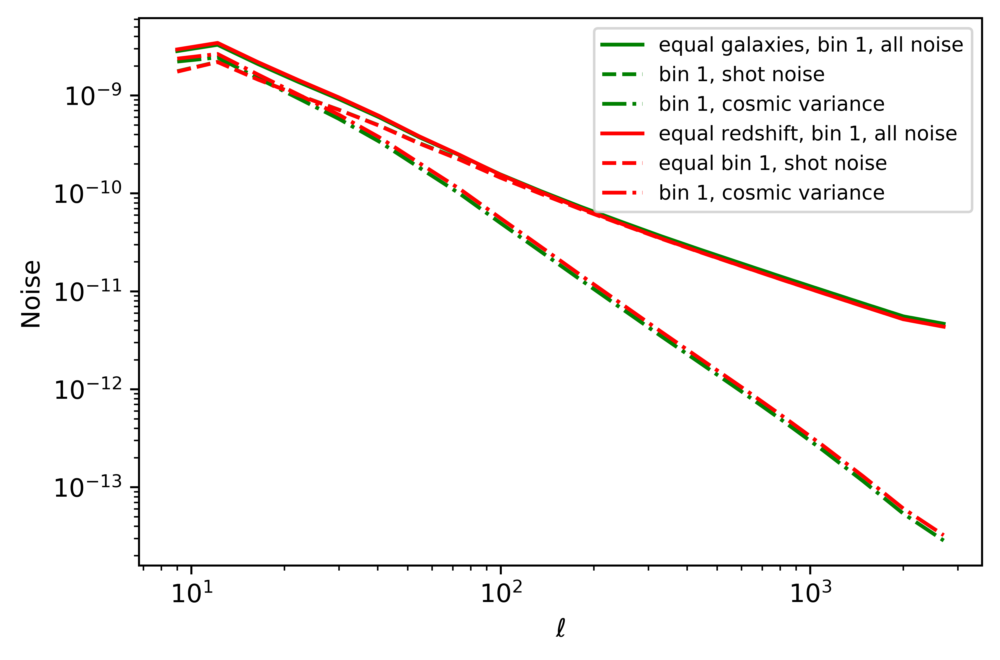

In [22]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 0, 0]), color='g', label = "equal galaxies, bin 1, all noise")
plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 0, 0]), color='g', ls="--", label = "bin 1, shot noise")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 0, 0]), color='g', ls="-.", label = "bin 1, cosmic variance")

plt.plot(binl, np.sqrt(binned_cov_s["z_4"][:, 0, 0]), color='r', label = "equal redshift, bin 1, all noise")
plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 0, 0]), color='r', ls="--", label = "equal bin 1, shot noise")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["z_4"][:, 0, 0]), color='r', ls="-.", label = "bin 1, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

large scale==> cosmic variance

small scale==> shot noise

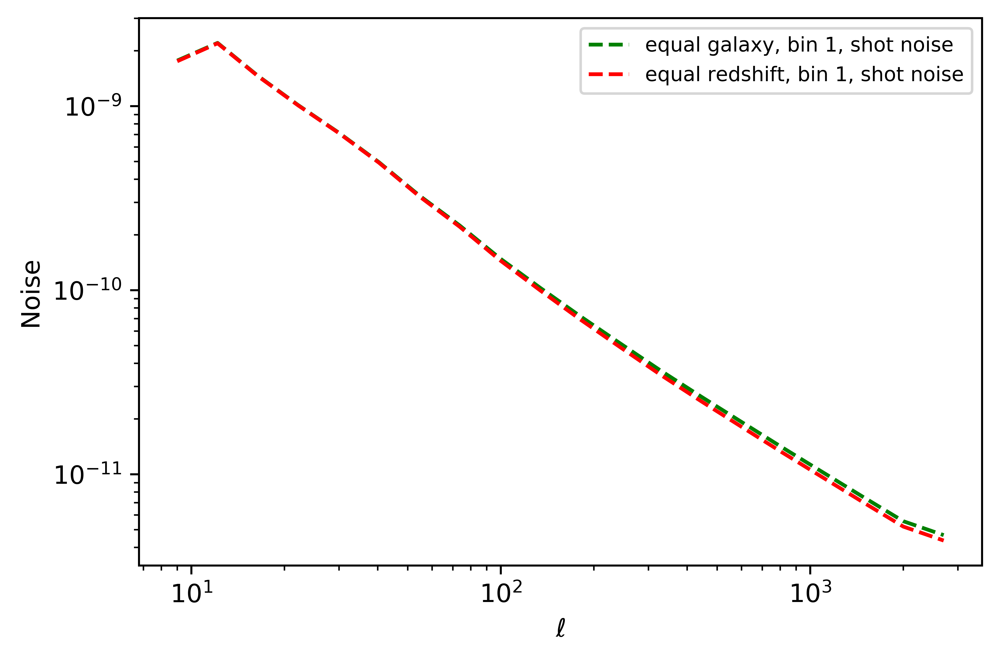

In [23]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 0, 0]), color='g', ls="--", label = "equal galaxy, bin 1, shot noise")

plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 0, 0]), color='r', ls="--", label = "equal redshift, bin 1, shot noise")
plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

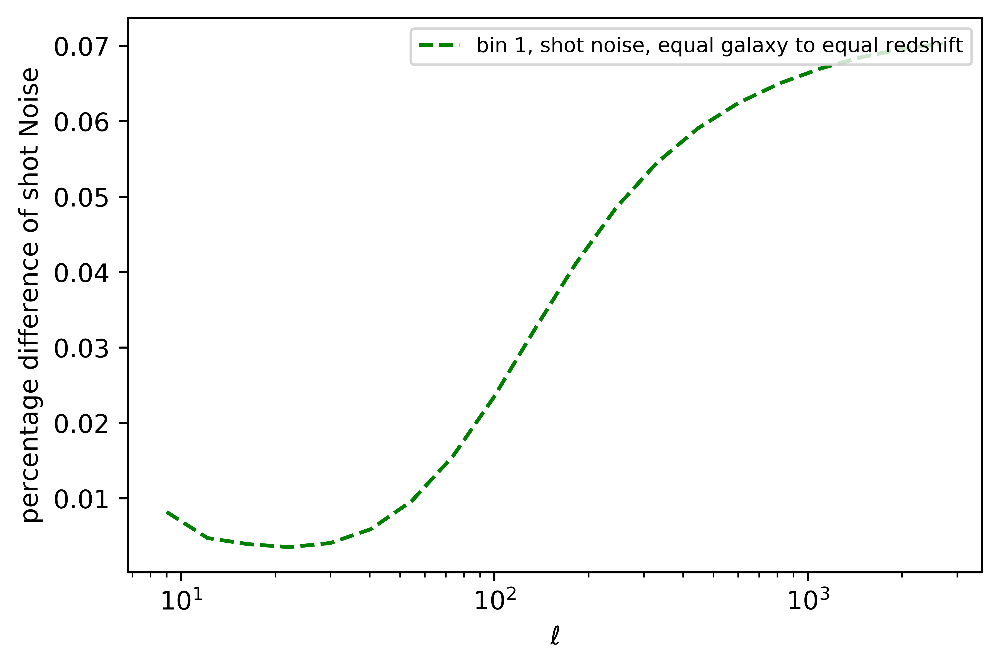

In [24]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 0, 0])/np.sqrt(binned_cov_shape_s["z_4"][:, 0, 0])-1, color='g', ls="--", label = "bin 1, shot noise, equal galaxy to equal redshift")
plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of shot Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

the shot noises in the covariance matrix in each autocorrelation bin enter as


$(cl(l)+\frac{\sigma_{\epsilon}^2}{2*n_g})^2- cl(l)^2$ =

$cl(l) * \frac {\sigma_{\epsilon}^2}{n_g} + \frac{\sigma_{\epsilon}^4}{4 n_g^2}$

the second term is on higher order, and we can ignore it for approximation

bin 1 of equal redshift extend to higher redshift compared to bin 1 of equal galaxy, therefore, bin 1 of equal redshift would include more number of galaxy, as well as higher signal.
the shot noise scale as 1/number of galaxies^2 as well as signal, then the equal redshift bin should have lower noise contribution from shot noise, which is what we see in the plot

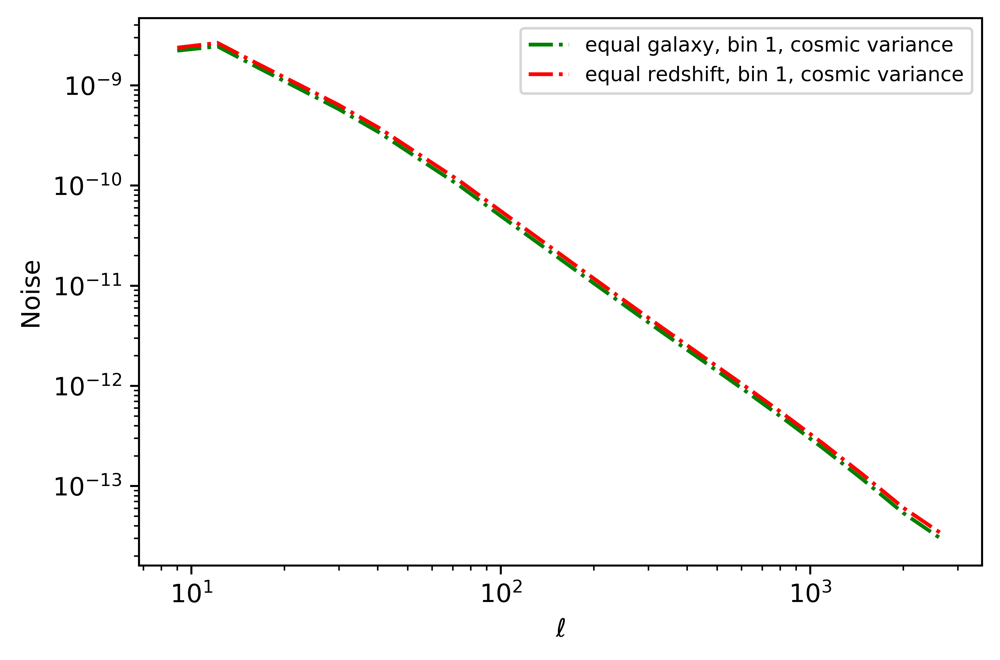

In [25]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 0, 0]), color='g', ls="-.", label = "equal galaxy, bin 1, cosmic variance")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["z_4"][:, 0, 0]), color='r', ls="-.", label = "equal redshift, bin 1, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

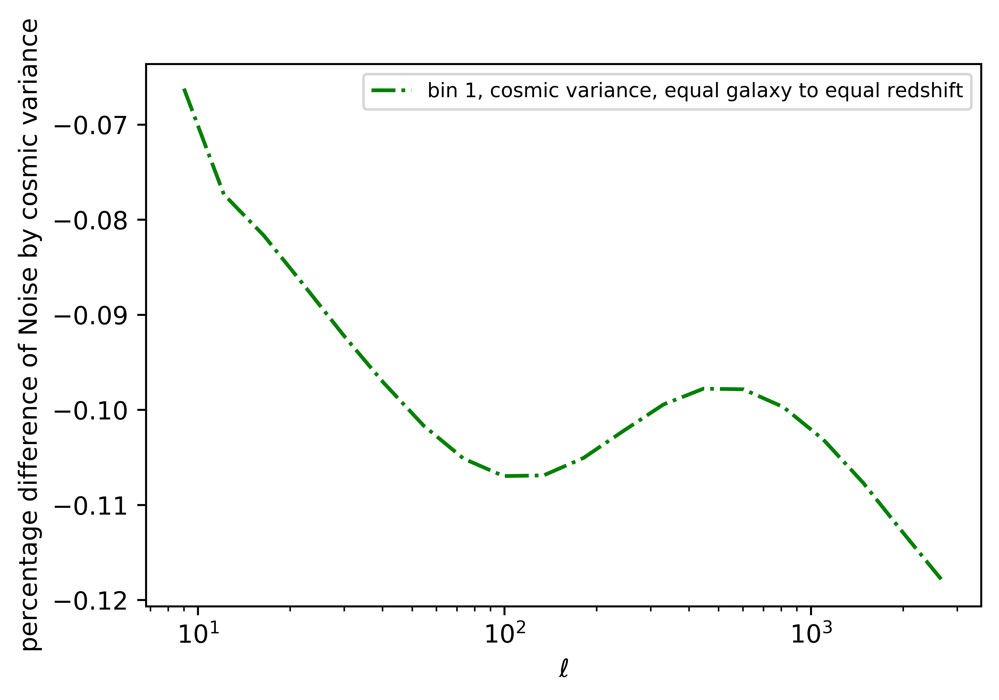

In [26]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 0, 0])/np.sqrt(binned_cov_cosvar_s["z_4"][:, 0, 0])-1, color='g', ls="-.", label = "bin 1, cosmic variance, equal galaxy to equal redshift")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of Noise by cosmic variance')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

cosmic variance scale as the number of modes in l, as well as the strength of the signal itself $P_{kk}$. Since the equal redshift bin extend to higher redshift, it has higher signal, thus higher noise as well compared to the equal galaxy case for each l

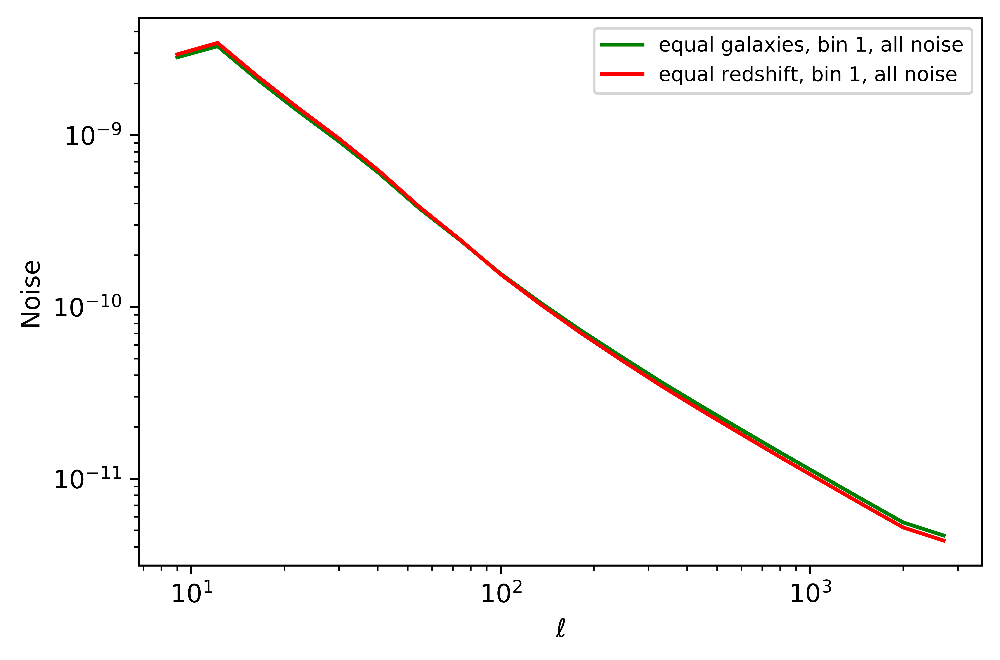

In [27]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 0, 0]), color='g', label = "equal galaxies, bin 1, all noise")
plt.plot(binl, np.sqrt(binned_cov_s["z_4"][:, 0, 0]), color='r', label = "equal redshift, bin 1, all noise")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

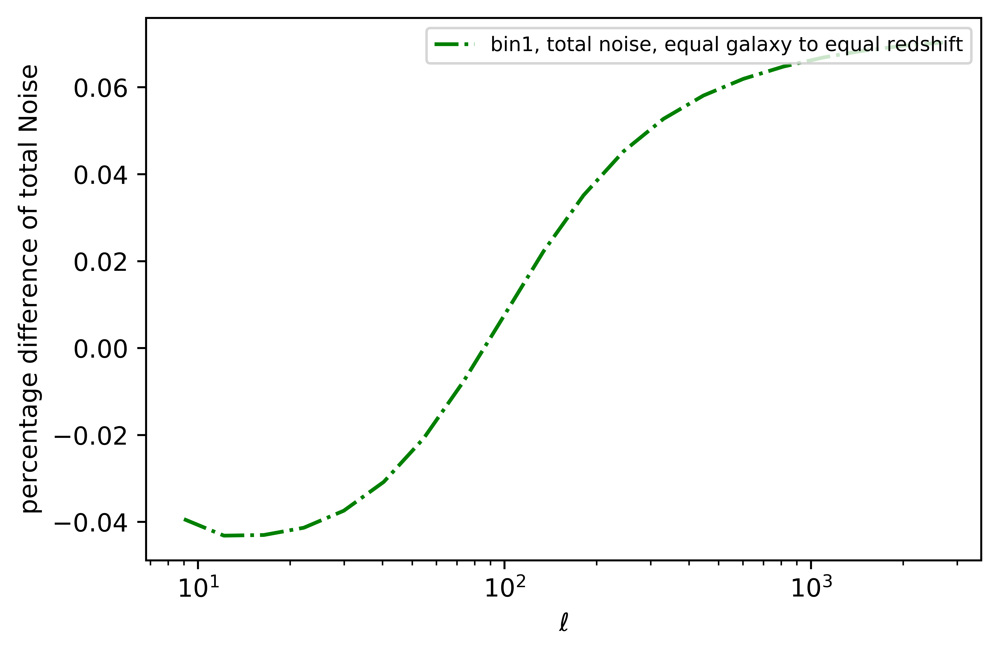

In [28]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 0, 0])/np.sqrt(binned_cov_s["z_4"][:, 0, 0])-1, color='g', ls="-.", label = "bin1, total noise, equal galaxy to equal redshift")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of total Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

at large scale, cosmic variance dominate the noise since there are fewer modes. At small scale, shot noise dominate for having limited number of galaxies.

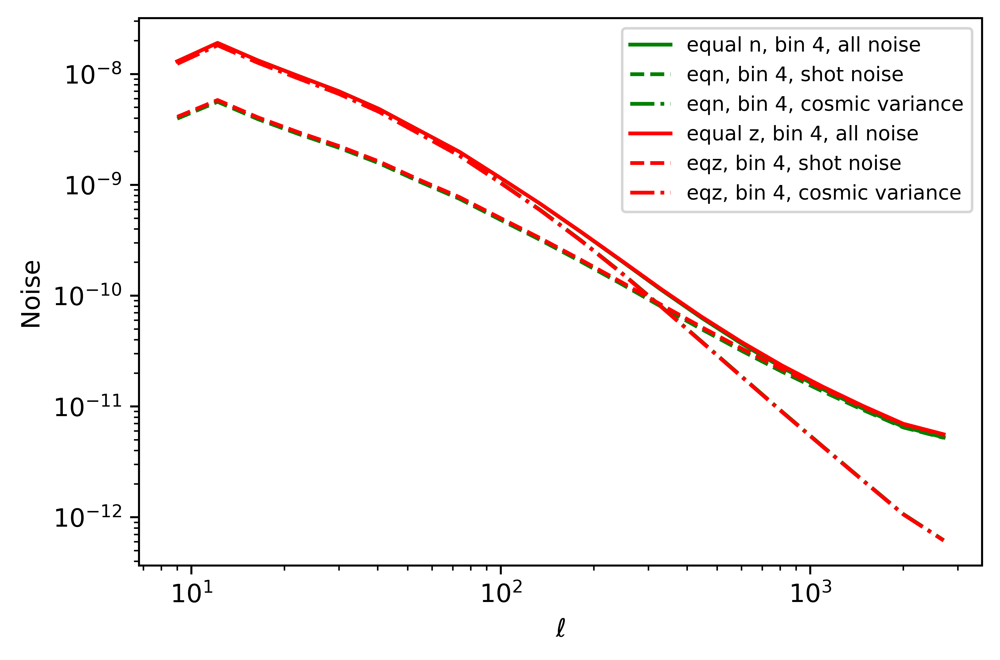

In [61]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 9, 9]), color='g', label = "equal n, bin 4, all noise")
plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9]), color='g', ls="--", label = "eqn, bin 4, shot noise")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 9, 9]), color='g', ls="-.", label = "eqn, bin 4, cosmic variance")

plt.plot(binl, np.sqrt(binned_cov_s["z_4"][:, 9, 9]), color='r', label = "equal z, bin 4, all noise")
plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9]), color='r', ls="--", label = "eqz, bin 4, shot noise")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["z_4"][:, 9, 9]), color='r', ls="-.", label = "eqz, bin 4, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

at large scale (l<20), the cosmic variance dominate. at small scale (l>30), the shot noise dominate

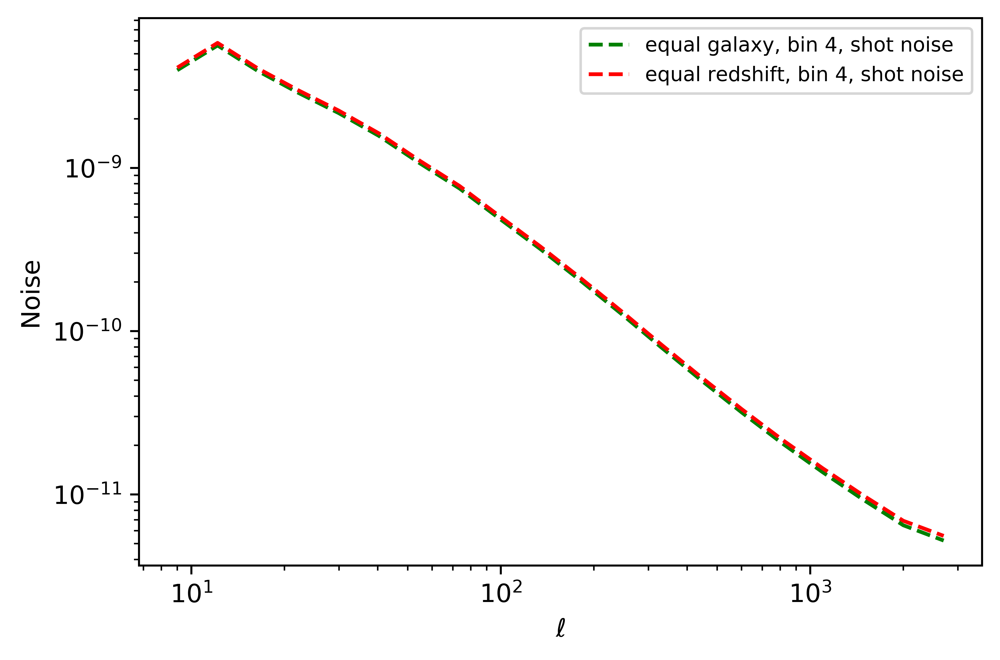

In [30]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9]), color='g', ls="--", label = "equal galaxy, bin 4, shot noise")

plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9]), color='r', ls="--", label = "equal redshift, bin 4, shot noise")
plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

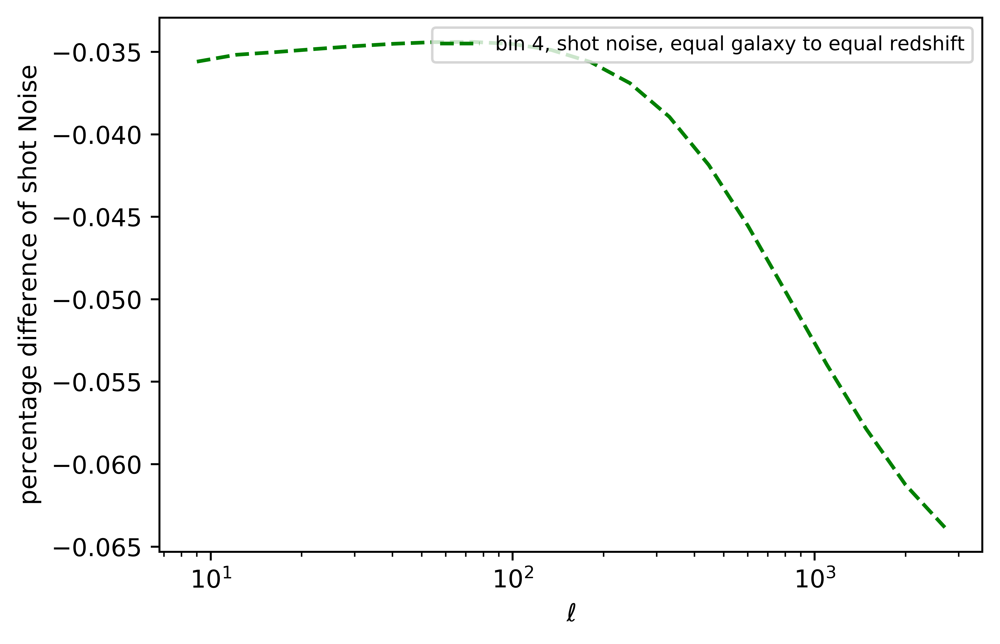

In [31]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9])/np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9])-1, color='g', ls="--", label = "bin 4, shot noise, equal galaxy to equal redshift")
plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of shot Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

in bin 4, equal galaxy case start with higher redshift. Therefore, the signal in equal galaxy case is higher than signal in the equal redshift case. However, the number of galaxy is higher in equal redshift case.

As shotnoise scale with 1/number of galaxy^2 (this term is higher for equal galaxy), as well as with signal (this term is higher for equal galaxy as well). In the plot, we see equal redshift case with higher shot noise, which is not what we are expecting 

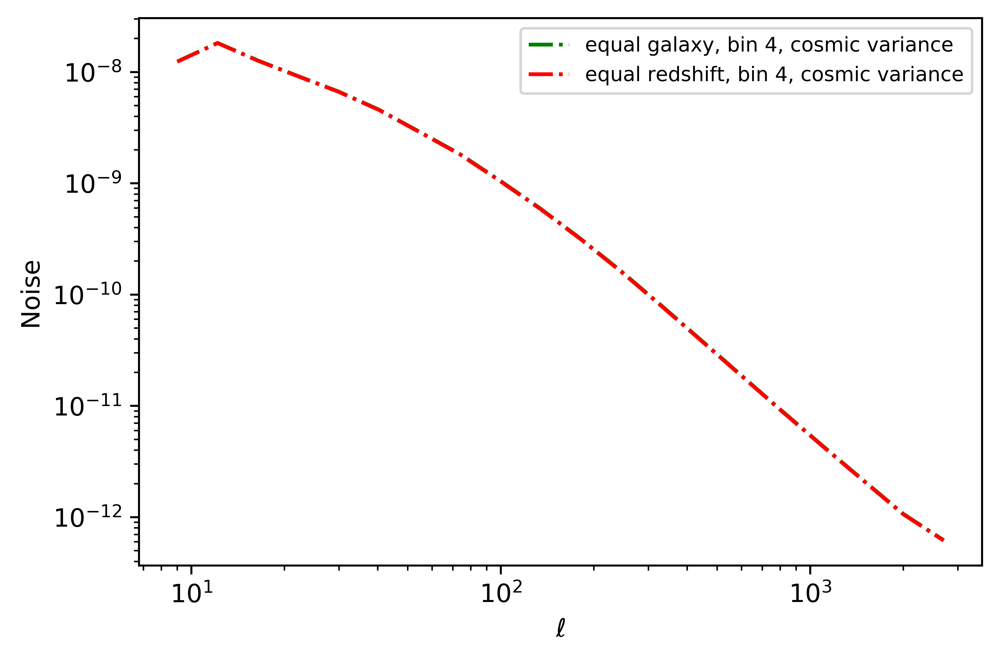

In [32]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 9, 9]), color='g', ls="-.", label = "equal galaxy, bin 4, cosmic variance")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["z_4"][:, 9, 9]), color='r', ls="-.", label = "equal redshift, bin 4, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

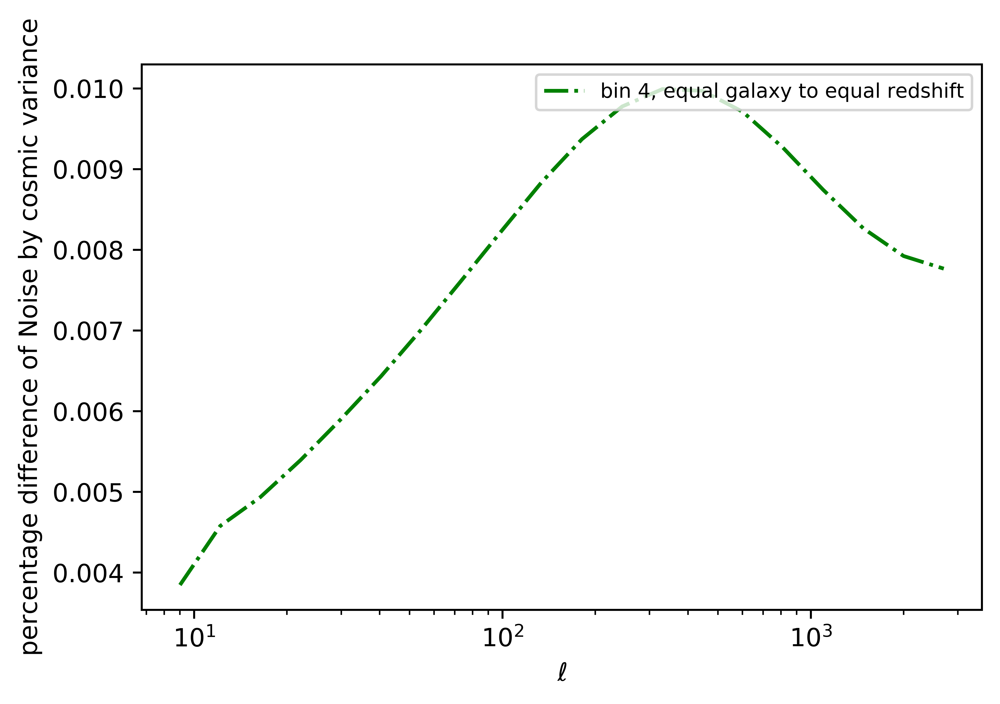

In [33]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 9, 9])/np.sqrt(binned_cov_cosvar_s["z_4"][:, 9, 9])-1, color='g', ls="-.", label = "bin 4, equal galaxy to equal redshift")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of Noise by cosmic variance')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

in bin 4, equal galaxy case start with higher redshift. Therefore, the signal in higher galaxy case is higher than the equal redshift case.

we expect equal galaxy case to have higher cosmic variance than equal redshift case. which is what's shown here

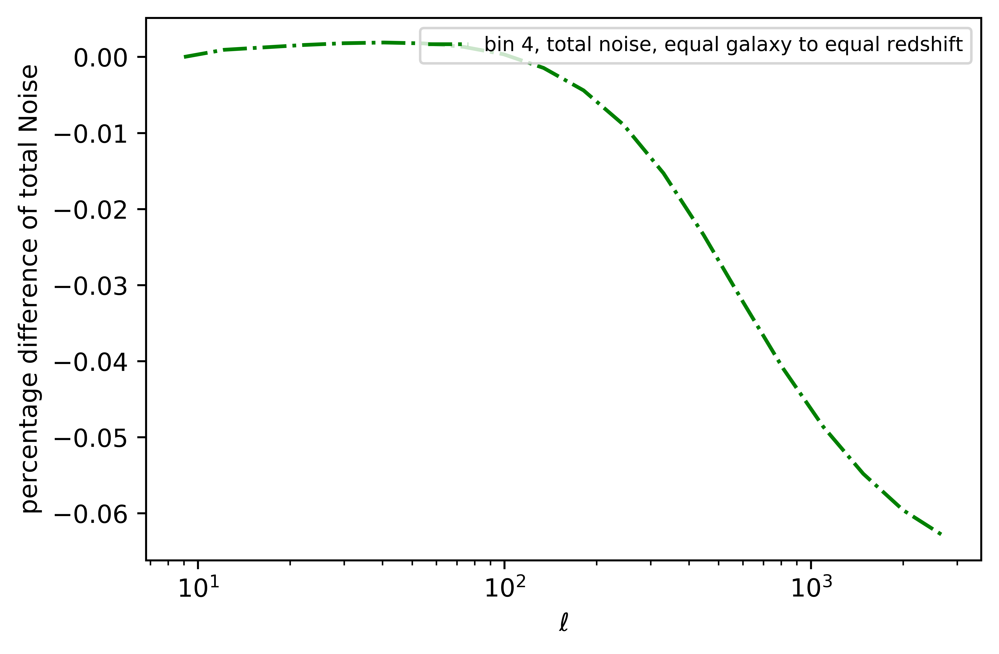

In [34]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 9, 9])/np.sqrt(binned_cov_s["z_4"][:, 9, 9])-1, color='g', ls="-.", label = "bin 4, total noise, equal galaxy to equal redshift")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of total Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

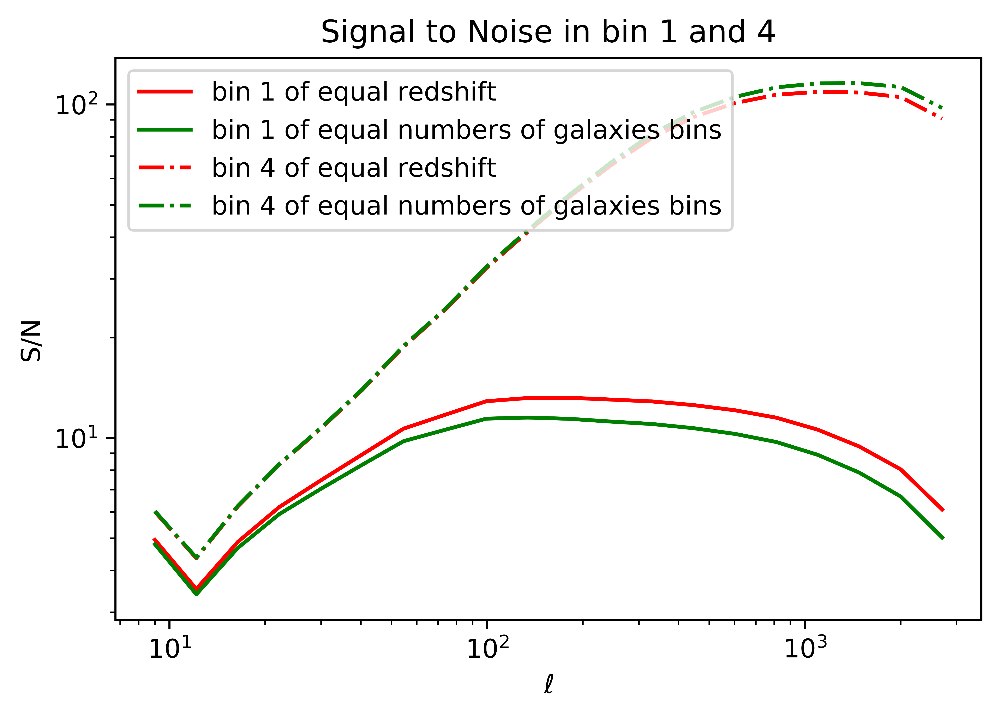

In [35]:
plt.figure()

plt.plot(binl, normalizing(binned_cl_s["z_4"][0], binl)/normalizing(np.sqrt(binned_cov_s["z_4"][:, 0, 0]), binl), color='r', label = "bin 1 of equal redshift")
plt.plot(binl, normalizing(binned_cl_s["n_4"][0], binl)/normalizing(np.sqrt(binned_cov_s["n_4"][:, 0, 0]), binl), color='g', label = "bin 1 of equal numbers of galaxies bins")

plt.plot(binl, normalizing(binned_cl_s["z_4"][9], binl)/normalizing(np.sqrt(binned_cov_s["z_4"][:, 9, 9]), binl), color='r', ls='-.', label = "bin 4 of equal redshift")
plt.plot(binl, normalizing(binned_cl_s["n_4"][9], binl)/normalizing(np.sqrt(binned_cov_s["n_4"][:, 9, 9]), binl), color='g', ls='-.', label = "bin 4 of equal numbers of galaxies bins")


plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('S/N')
plt.legend(loc="upper left")
plt.title("Signal to Noise in bin 1 and 4")
plt.show() 

In [36]:
0, 4, 7, 9

(0, 4, 7, 9)

In [40]:
def SignalToNoise_o(cl, cov):
    """calculate the signal to noise for the given cl signal, and covariance array, in a single tomographic bin"""
    stn_sq = 0
    for i in range(len(cl)):
        stn_sq = stn_sq + cl[i]**2/ cov[i]
    stn = np.sqrt(stn_sq)
    return stn

In [43]:
stn_4 = {}
stn_cosvar = {}
stn_shape = {}
for btype in ["n", "z"]:
    for i, x in enumerate([0, 4, 7, 9]):
        stn_4["{0}_{1}".format(btype,i+1)] = SignalToNoise_o(binned_cl_s["{0}_4".format(btype)][x], binned_cov_s["{0}_4".format(btype)][:, x, x])
        stn_cosvar["{0}_{1}".format(btype, i+1)] = SignalToNoise_o(binned_cl_s["{0}_4".format(btype)][x], binned_cov_cosvar_s["{0}_4".format(btype)][:, x, x])
        stn_shape["{0}_{1}".format(btype, i+1)] = SignalToNoise_o(binned_cl_s["{0}_4".format(btype)][x], binned_cov_shape_s["{0}_4".format(btype)][:, x, x])
        

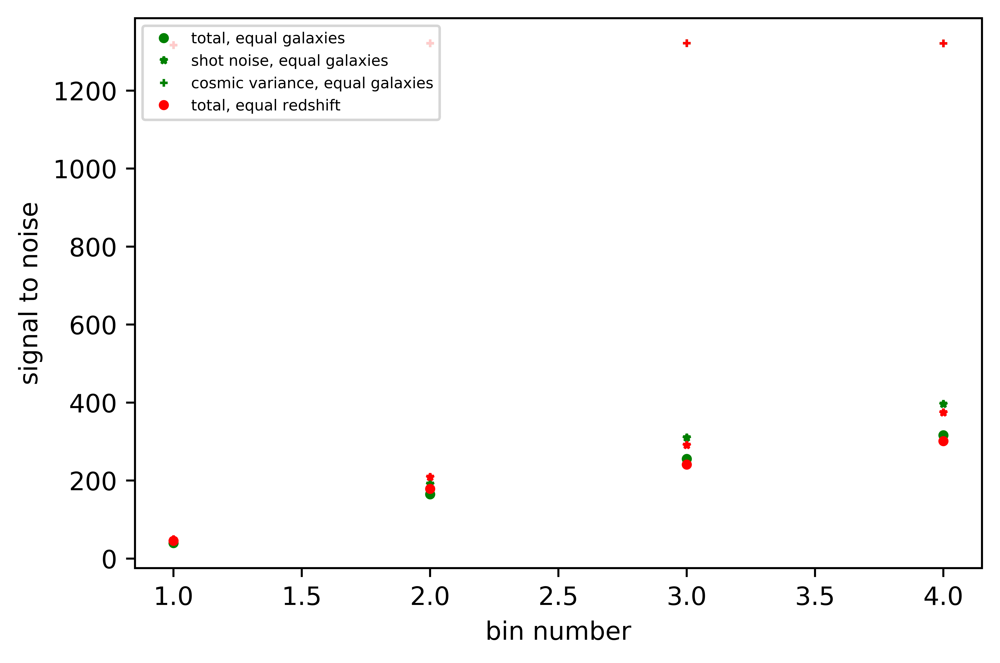

In [44]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [stn_4["n_1"], stn_4["n_2"],stn_4["n_3"], stn_4["n_4"]],
         color='g', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_shape["n_1"], stn_shape["n_2"],stn_shape["n_3"], stn_shape["n_4"]],
         color='g', linestyle='None', marker ="*", markersize = 3.0, label = "shot noise, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_cosvar["n_1"], stn_cosvar["n_2"],stn_cosvar["n_3"], stn_cosvar["n_4"]],
         color='g', linestyle='None', marker ="+", markersize = 3.0, label = "cosmic variance, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_4["z_1"], stn_4["z_2"],stn_4["z_3"], stn_4["z_4"]],
         color='r', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal redshift")

plt.plot([1, 2, 3, 4], [stn_shape["z_1"], stn_shape["z_2"],stn_shape["z_3"], stn_shape["z_4"]],
         color='r', linestyle='None', marker ="*", markersize = 3.0)

plt.plot([1, 2, 3, 4], [stn_cosvar["z_1"], stn_cosvar["z_2"],stn_cosvar["z_3"], stn_cosvar["z_4"]],
         color='r', linestyle='None', marker ="+", markersize = 3.0)

plt.xlabel("bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=6)
plt.show() 

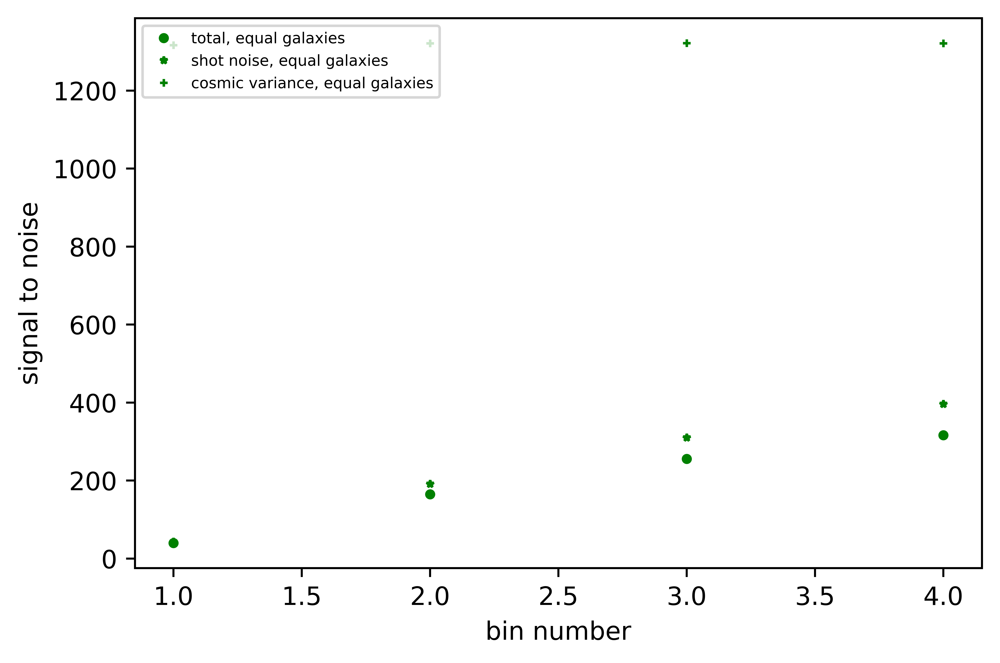

In [45]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [stn_4["n_1"], stn_4["n_2"],stn_4["n_3"], stn_4["n_4"]],
         color='g', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_shape["n_1"], stn_shape["n_2"],stn_shape["n_3"], stn_shape["n_4"]],
         color='g', linestyle='None', marker ="*", markersize = 3.0, label = "shot noise, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_cosvar["n_1"], stn_cosvar["n_2"],stn_cosvar["n_3"], stn_cosvar["n_4"]],
         color='g', linestyle='None', marker ="+", markersize = 3.0, label = "cosmic variance, equal galaxies")
plt.xlabel("bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=6)
plt.show() 

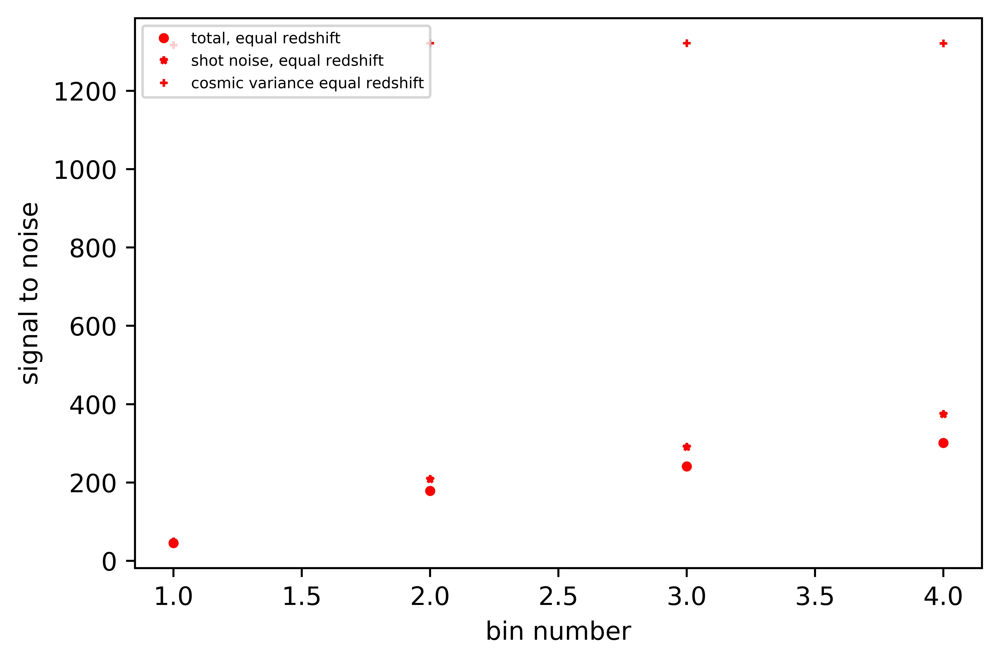

In [47]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()

plt.plot([1, 2, 3, 4], [stn_4["z_1"], stn_4["z_2"],stn_4["z_3"], stn_4["z_4"]],
         color='r', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal redshift")

plt.plot([1, 2, 3, 4], [stn_shape["z_1"], stn_shape["z_2"],stn_shape["z_3"], stn_shape["z_4"]],
         color='r', linestyle='None', marker ="*", markersize = 3.0, label = "shot noise, equal redshift")

plt.plot([1, 2, 3, 4], [stn_cosvar["z_1"], stn_cosvar["z_2"],stn_cosvar["z_3"], stn_cosvar["z_4"]],
         color='r', linestyle='None', marker ="+", markersize = 3.0, label = "cosmic variance equal redshift")

plt.xlabel("bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=6)
plt.show() 

in both case, the shot noise dominate signal to noise
as bin goes into higher redshift, the shot noise become less significant

In [49]:
 [stn_cosvar["n_1"], stn_cosvar["n_2"],stn_cosvar["n_3"], stn_cosvar["n_4"]]

[1316.8227395389279,
 1321.4740037429708,
 1321.7577465713914,
 1321.2859230944778]

In [52]:
[stn_cosvar["z_1"], stn_cosvar["z_2"],stn_cosvar["z_3"], stn_cosvar["z_4"]]

[1317.215250768366, 1321.5490942044428, 1321.770961345131, 1321.3028404243928]

In [53]:
[stn_cosvar["z_1"]/stn_cosvar["n_1"], stn_cosvar["z_2"]/stn_cosvar["n_2"],stn_cosvar["z_3"]/stn_cosvar["n_3"], stn_cosvar["z_4"]/stn_cosvar["n_4"]]

[1.0002980744618488,
 1.0000568232604343,
 1.0000099978787897,
 1.0000128036858786]

In [56]:
arrrrray= [stn_cosvar["z_1"]/stn_cosvar["n_1"]-1, stn_cosvar["z_2"]/stn_cosvar["n_2"]-1,stn_cosvar["z_3"]/stn_cosvar["n_3"]-1, stn_cosvar["z_4"]/stn_cosvar["n_4"]-1]

In [58]:
arrrrray

[0.00029807446184881847,
 5.6823260434324396e-05,
 9.997878789747006e-06,
 1.2803685878637339e-05]

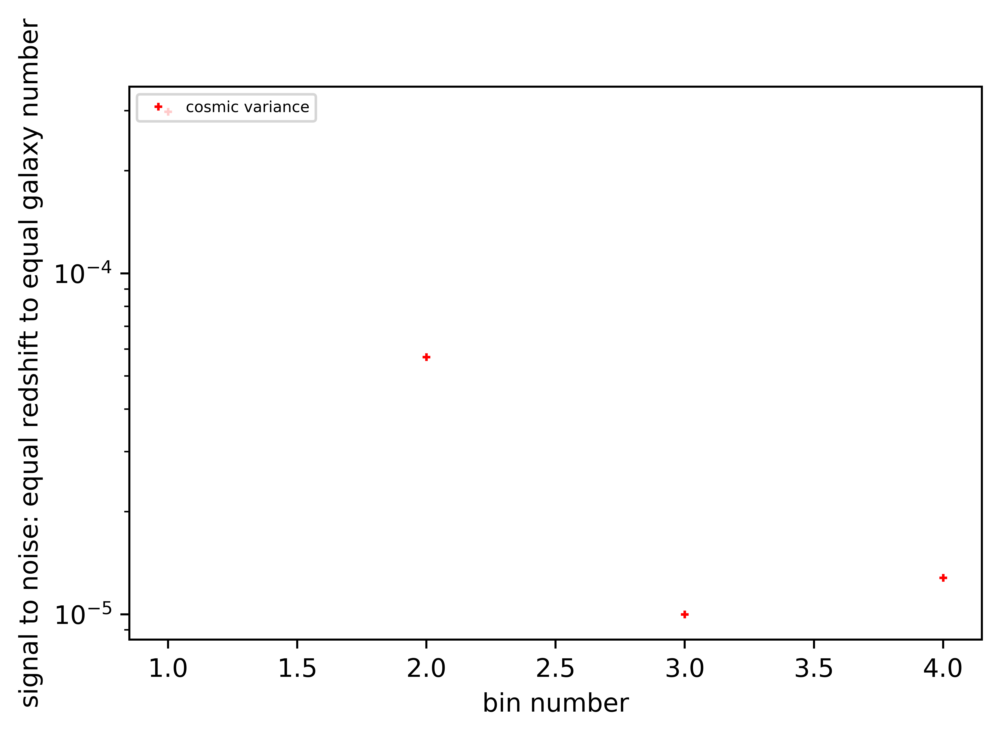

In [59]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()

plt.plot([1, 2, 3, 4], arrrrray,
         color='r', linestyle='None', marker ="+", markersize = 3.0, label = "cosmic variance")

plt.yscale("log")
plt.xlabel("bin number")
plt.ylabel("signal to noise: equal redshift to equal galaxy number")
plt.legend(loc="upper left", fontsize=6)
plt.show() 

in both case, cosmic variance is the smaller contribution to signal to noise. future more, in each bin, both cases have similar value of signal to noise for cosmic variance (within 10^-3 difference)

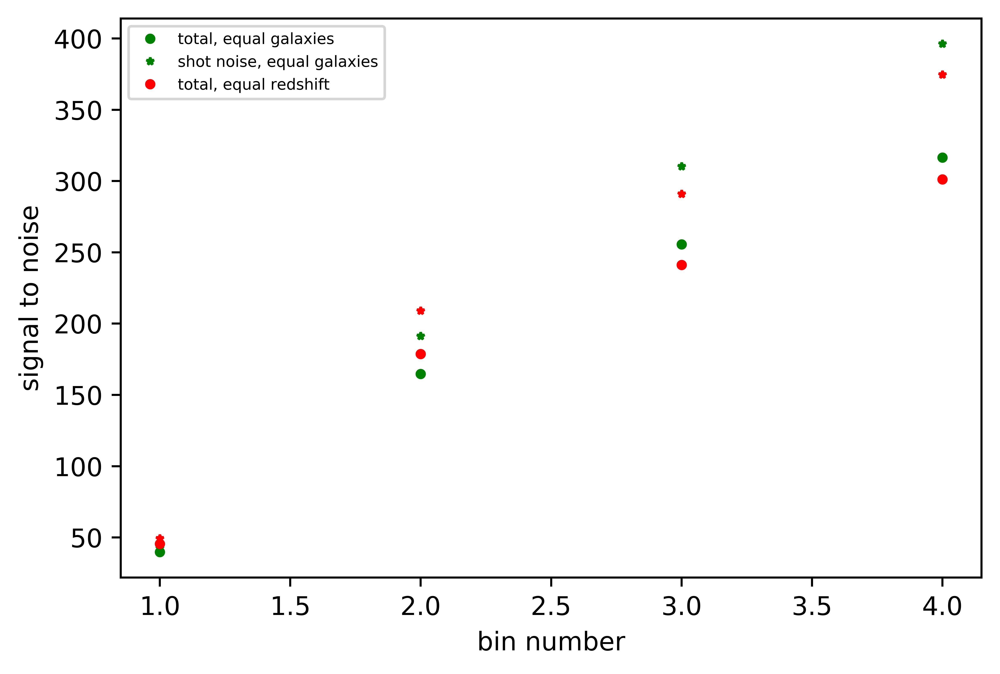

In [60]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [stn_4["n_1"], stn_4["n_2"],stn_4["n_3"], stn_4["n_4"]],
         color='g', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_shape["n_1"], stn_shape["n_2"],stn_shape["n_3"], stn_shape["n_4"]],
         color='g', linestyle='None', marker ="*", markersize = 3.0, label = "shot noise, equal galaxies")


plt.plot([1, 2, 3, 4], [stn_4["z_1"], stn_4["z_2"],stn_4["z_3"], stn_4["z_4"]],
         color='r', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal redshift")

plt.plot([1, 2, 3, 4], [stn_shape["z_1"], stn_shape["z_2"],stn_shape["z_3"], stn_shape["z_4"]],
         color='r', linestyle='None', marker ="*", markersize = 3.0)

plt.xlabel("bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=6)
plt.show() 

contribution from shot noise to signal to noise is higher for equal redshift case in bin 1 and 2, and for equal galaxy case in bin 3 and 4.

let's remind us again the binning.

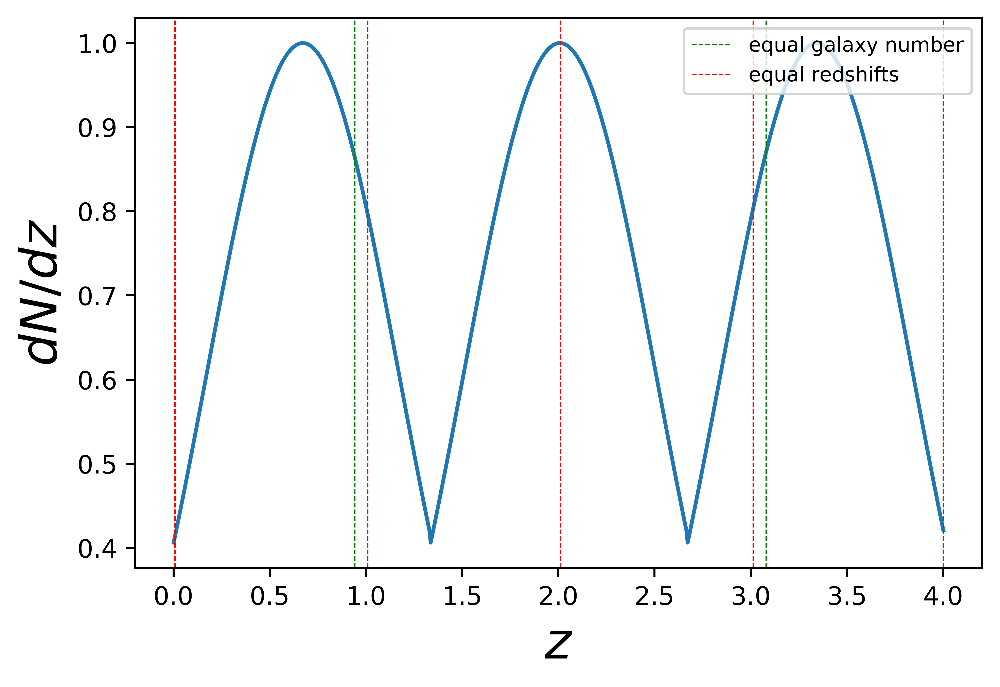

In [39]:
#quick remind
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_4"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_4"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

in bin 1, equal redshift bins have higher signal, and lower shot noise as well, which make the signal to noise in equal redshift bin to be higher than that of equal galaxy number bin

in bin 2, equal redshift bin again have higher signal. Let's check the shot noise below

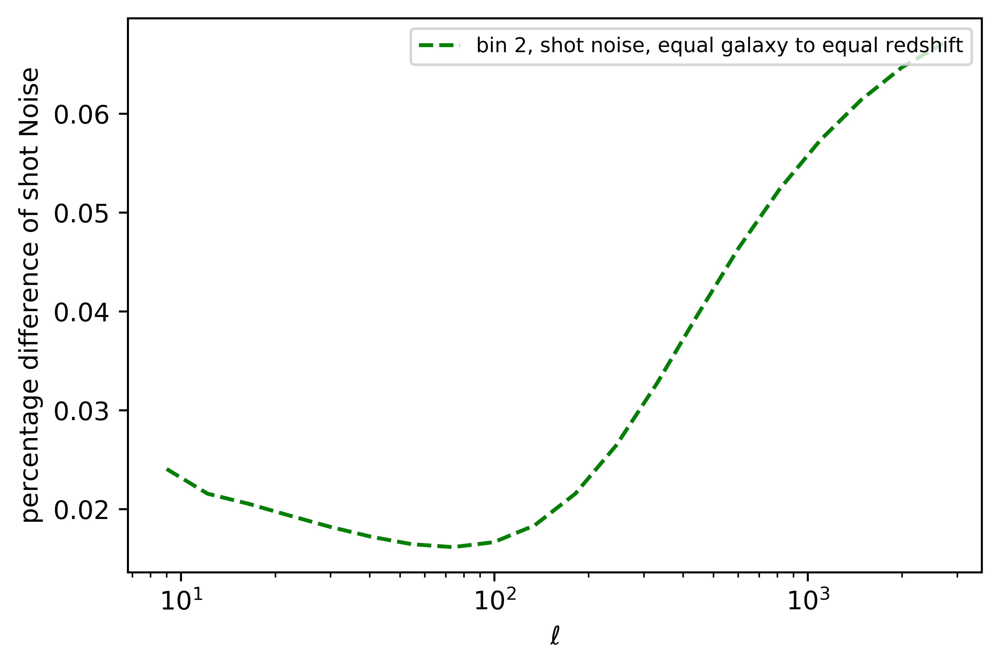

In [62]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 4, 4])/np.sqrt(binned_cov_shape_s["z_4"][:, 4, 4])-1, color='g', ls="--", label = "bin 2, shot noise, equal galaxy to equal redshift")
plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of shot Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

bin 2 of equal redshift starts with higher redshift compared to bin 2 of equal galaxy, therefore, bin 2 of equal redshift would include less number of galaxy. The equal redshift bin would also have higher signal. the shot noise scale as 1/number of galaxies^2 (this term would be higher for equal redshift case), as well as signal (this term would be higher for equal redshift as well). However, we see higher shot noise for equal galaxy in the plot above


according to the plot, the equal galaxy case would have higher shot noise. At the mean time, the signal in equal galaxy case is lower. Therefore, we expect a lower signal to noise in equal galaxy case for bin 2

Does the 3rd bin make sense?

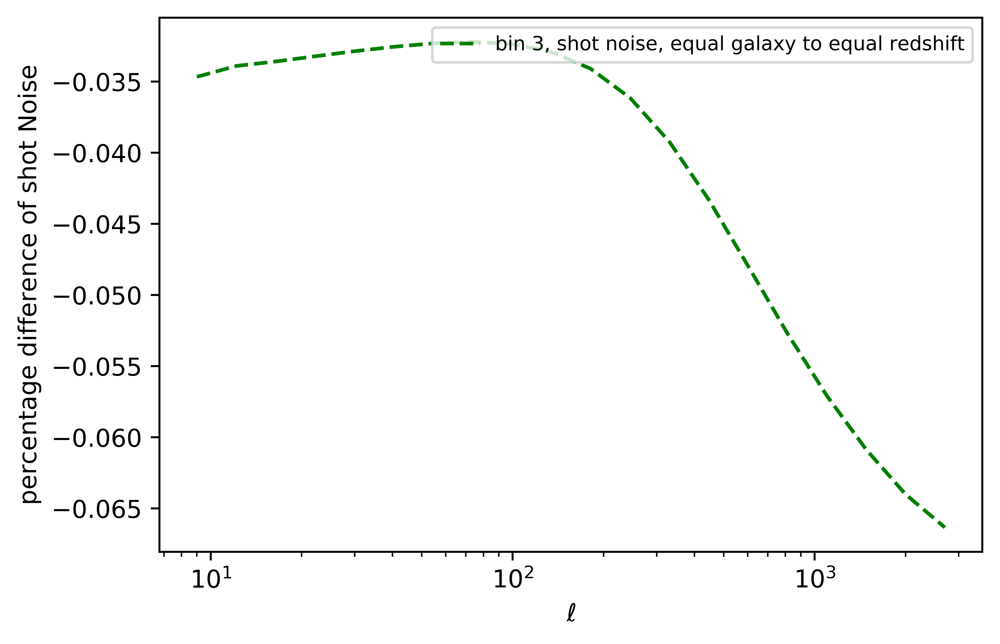

In [67]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 7, 7])/np.sqrt(binned_cov_shape_s["z_4"][:, 7, 7])-1, color='g', ls="--", label = "bin 3, shot noise, equal galaxy to equal redshift")
plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of shot Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

bin 3 of equal redshift end with lower redshift compared to bin 2 of equal galaxy, therefore, bin 2 of equal redshift would include less number of galaxy. The equal redshift bin would also have lower signal. the shot noise scale as 1/number of galaxies^2 (this term would be higher for equal redshift case), as well as signal (this term would be higher for equal galaxy number). we see higher shot noise for equal redshift in the plot above, the reasonable explanation (only if the calculation here is correct) is that noise contribution from number of galaxy suppress the noise contribution of signal.

according to the plot, the equal galaxy case would have lower shot noise. At the mean time, the signal in equal galaxy case is higher. Therefore, we expect a higher signal to noise in equal galaxy case for bin 3.


As we had analyzed in entry 31, in bin 4, equal galaxy case start with higher redshift. Therefore, the signal in equal galaxy case is higher than signal in the equal redshift case. However, the number of galaxy is higher in equal redshift case. shotnoise scale with 1/number of galaxy^2 (this term is higher for equal galaxy), as well as with signal (this term is higher for equal galaxy as well). In the plot, we see equal galaxy case with lower shot noise, which is not what we are expecting.

if the plot for entry 31 were correct, the equal galaxy case would have lower shot noise as well as higher signal. Therefore, we expect a higher signal to noise in equal galaxy case for bin 4.